# <b> Part 1. Data Exploration
-----------------------------------------------------------------------------------------------------------------

## <b>1. Check Development Environment

In [64]:
# Query GPU device state
!nvidia-smi 

Sun Apr 26 00:59:23 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 441.22       Driver Version: 441.22       CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce GTX 105... WDDM  | 00000000:03:00.0 Off |                  N/A |
| N/A   36C    P8    N/A /  N/A |   1992MiB /  4096MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [65]:
# Check CUDA version
!nvcc --version 

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Wed_Oct_23_19:32:27_Pacific_Daylight_Time_2019
Cuda compilation tools, release 10.2, V10.2.89


In [66]:
# Check essential libraries and GPU state
import torch
import tensorflow as tf # for the use of TensorBoard
print(f"PyTorch Version: {torch.__version__}")
print(f"TensorFlow Version: {tf.__version__}")
print(f"CUDA availability: {torch.cuda.is_available()}")
print(f"# of GPU: {torch.cuda.device_count()}")
print(torch.cuda.get_device_name(0))

PyTorch Version: 1.3.1
TensorFlow Version: 2.0.0
CUDA availability: True
# of GPU: 1
GeForce GTX 1050 with Max-Q Design


## <b>2. Image Data Exploration

In [67]:
# Import libraries for data exploration
import os
from matplotlib import pyplot as plt
import cv2
import json
import pandas as pd
import glob

# Import common and essential Libraries for detectron2 set-up 
import numpy as np
import random

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
# from google.colab.patches import cv2_imshow

In [68]:
# Load a json file for train
df_car = pd.read_json('dataset/annotations/train_base.json')
df_car

,2.jpg94448,3.jpg100697,5.jpg75055,6.jpg51549,7.jpg74180,8.jpg113930,9.jpg99629,10.jpg66088,13.jpg59970,14.jpg52526,...,68.jpg88752,70.jpg132021,71.jpg111588,73.jpg135544,74.jpg88098,75.jpg178199,76.jpg75227,78.jpg182672,79.jpg129189,80.jpg202415
filename,2.jpg,3.jpg,5.jpg,6.jpg,7.jpg,8.jpg,9.jpg,10.jpg,13.jpg,14.jpg,...,68.jpg,70.jpg,71.jpg,73.jpg,74.jpg,75.jpg,76.jpg,78.jpg,79.jpg,80.jpg
size,94448,100697,75055,51549,74180,113930,99629,66088,59970,52526,...,88752,132021,111588,135544,88098,178199,75227,182672,129189,202415
regions,"[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...",...,"[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all...","[{'shape_attributes': {'name': 'polygon', 'all..."
file_attributes,{},{},{},{},{},{},{},{},{},{},...,{},{},{},{},{},{},{},{},{},{}


In [69]:
# Review information of the json file
ROOT_DIR = os.getcwd()
print(f"Current diectory {ROOT_DIR}")
annotations = json.load(open(os.path.join(ROOT_DIR, "dataset/annotations/train_base.json"), encoding="utf8"))
# print(annotations1)
annotations = list(annotations.values()) 
annotations = [a for a in annotations if a['regions']]
annotations[17]

Current diectory C:\Car_Damage


{'filename': '22.jpg',
 'size': 108120,
 'regions': [{'shape_attributes': {'name': 'polyline',
    'all_points_x': [790, 735, 756, 776, 804, 816, 834, 790, 791, 790],
    'all_points_y': [251, 197, 137, 126, 123, 139, 150, 186, 225, 248]},
   'region_attributes': {'damage': 'dent'}},
  {'shape_attributes': {'name': 'polygon',
    'all_points_x': [434, 393, 415, 413, 449],
    'all_points_y': [398, 473, 585, 648, 549]},
   'region_attributes': {'damage': 'dent'}},
  {'shape_attributes': {'name': 'polygon',
    'all_points_x': [525, 467, 473, 650, 810, 806, 758, 683, 635, 575],
    'all_points_y': [629, 555, 354, 300, 400, 588, 566, 456, 443, 514]},
   'region_attributes': {'damage': 'dent'}}],
 'file_attributes': {}}

In [70]:
# Verify the number of images for training and validation
# To minimise the labelling cost, this experiment starts with a very small set of data
# Total count: 70, training 62, validation 8
train_images = glob.glob(os.path.join('dataset', 'train_base', '*.jpg'))
val_images = glob.glob(os.path.join('dataset', 'val_base', '*.jpg'))
n_images_t = len(train_images)
n_images_v = len(val_images)
print(f"training images count: {n_images_t}")
print(f"validaion images count: {n_images_v}")

training images count: 62
validaion images count: 8


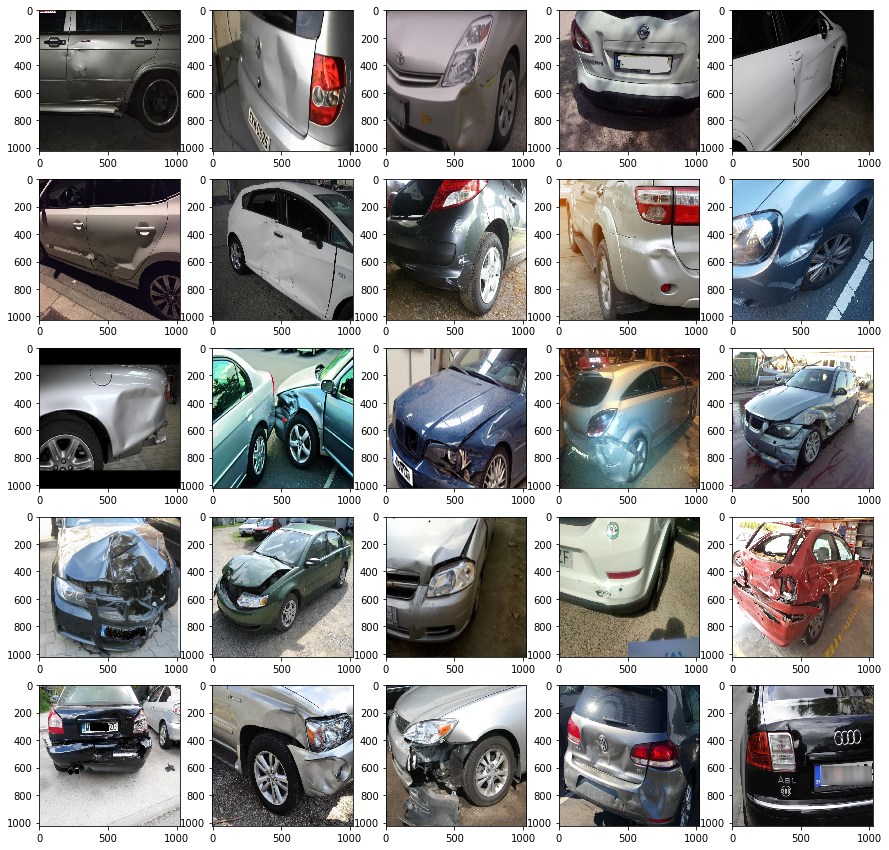

In [71]:
# Check some images of damaged cars for training
fig = plt.figure(figsize=(15, 15))
columns = 5
rows = 5
for i in range(1, columns*rows + 1):
    if (i-1) == n_images_t:
        break
    img = plt.imread(train_images[i-1])
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

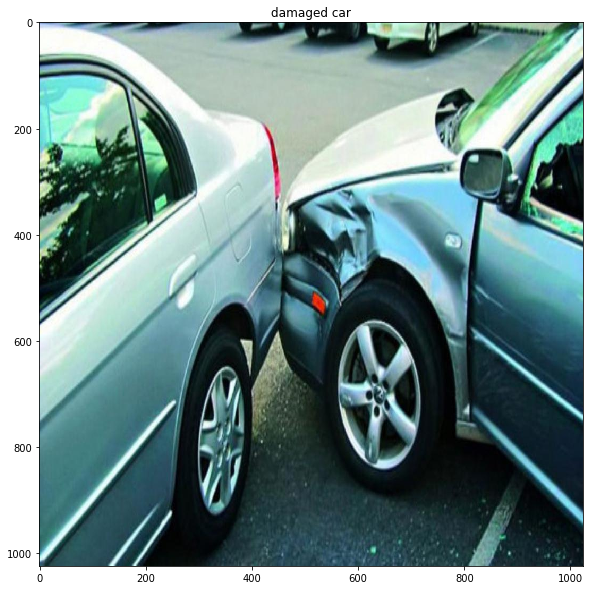

In [72]:
# Verify a random image of damaged cars: '22.jpg' - class: 1, dent
img = cv2.imread("dataset/train_base/22.jpg") # 22.jpg
img2 = img[:,:,::-1]

plt.figure(figsize=(10,10))
plt.imshow(img2)
plt.title('damaged car')
plt.show()

In [73]:
# Get the labelled polygon(mask) - The above image, 22.jpg 
l = []
for d in annotations[17]['regions'][0]['shape_attributes'].values():
    l.append(d)
display('x co-ordinates of the damage:',l[1])    
display('y co-ordinates of the damage:',l[2])

'x co-ordinates of the damage:'

[790, 735, 756, 776, 804, 816, 834, 790, 791, 790]

'y co-ordinates of the damage:'

[251, 197, 137, 126, 123, 139, 150, 186, 225, 248]

In [74]:
# Get the labelled class - The above image, 22.jpg 
l = []
for d in annotations[17]['regions'][0]['region_attributes'].values():
    l.append(d)
display('damage class:',l[0])    

'damage class:'

'dent'

## <b>3. Explore Pre-trained Models 

### 1) Mask R-CNN <b>ResNet-50 FPN 1x</b> Backbone (<b>COCO</b> mask_rcnn_R_50_FPN_1x.yaml)

In [75]:
# Create a detectron2 config and DefaultPredictor to run inference on the above image.
# COCO models were trained on train2017 and evaluated on val2017
# 1x (~12 COCO epochs) training schedule 1x models are heavily under-trained
# 3x schedule (~37 COCO epochs)
# COCO 2017: 123,287 images, 886,284 instances, 172 classes
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Set threshold for this model
# Use a ResNet-50-FPN backbone
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(img)

In [76]:
# Check the outputs of inference
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([2, 2, 2, 2, 2, 2], device='cuda:0')
Boxes(tensor([[6.1633e+02, 1.2707e+00, 8.3305e+02, 6.1709e+01],
        [2.3045e+01, 1.0939e+01, 6.9369e+02, 9.9355e+02],
        [4.9174e+02, 1.0595e+00, 6.1532e+02, 4.1914e+01],
        [3.6547e+02, 3.2410e+01, 1.0167e+03, 9.1427e+02],
        [3.7721e+02, 9.3072e-01, 6.1492e+02, 3.7414e+01],
        [3.7343e+02, 1.3668e-02, 4.9033e+02, 2.4360e+01]], device='cuda:0'))


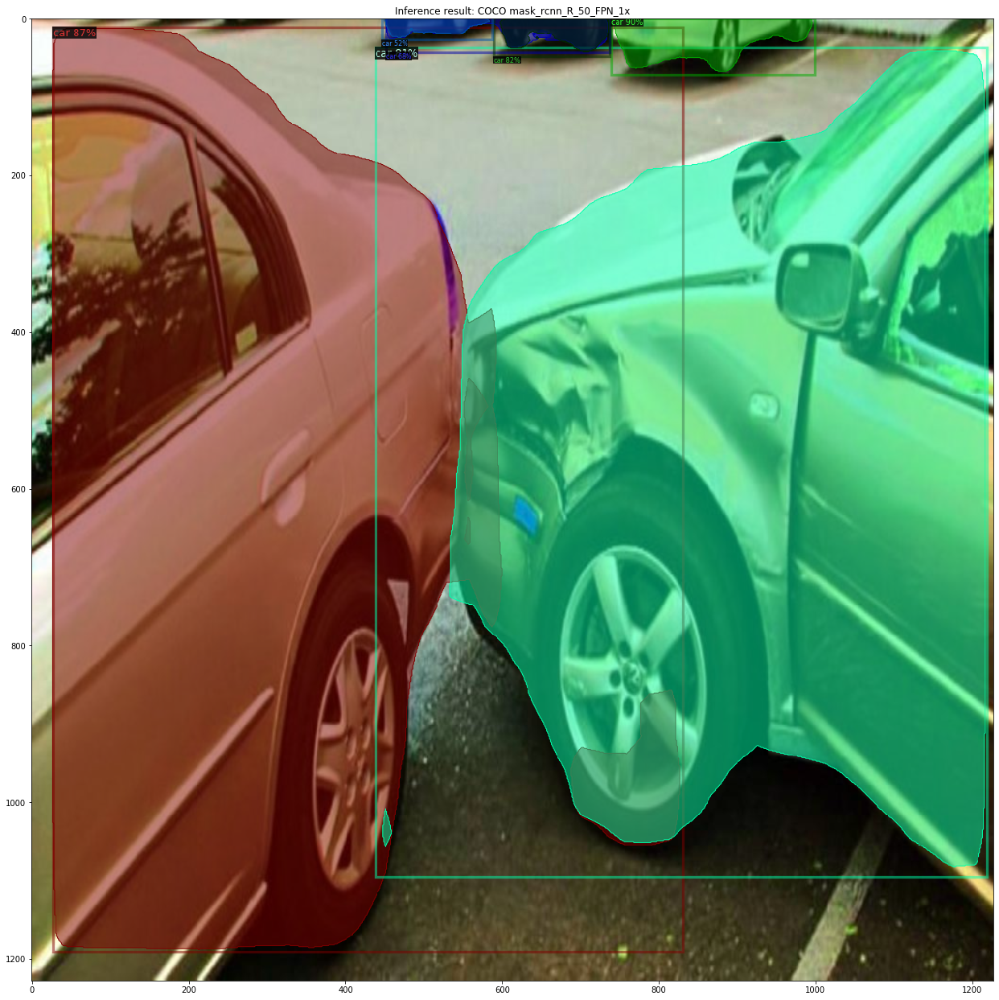

In [77]:
# Use `Visualizer` to draw the predictions on the image.
v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))

plt.figure(figsize=(22,22))
plt.imshow(v.get_image()[:, :, ::-1])
plt.title('Inference result: COCO mask_rcnn_R_50_FPN_1x')
plt.show()

### 2) Mask R-CNN <b>ResNet-50 FPN 3x</b> Backbone (<b>COCO</b> mask_rcnn_R_50_FPN_3x.yaml)

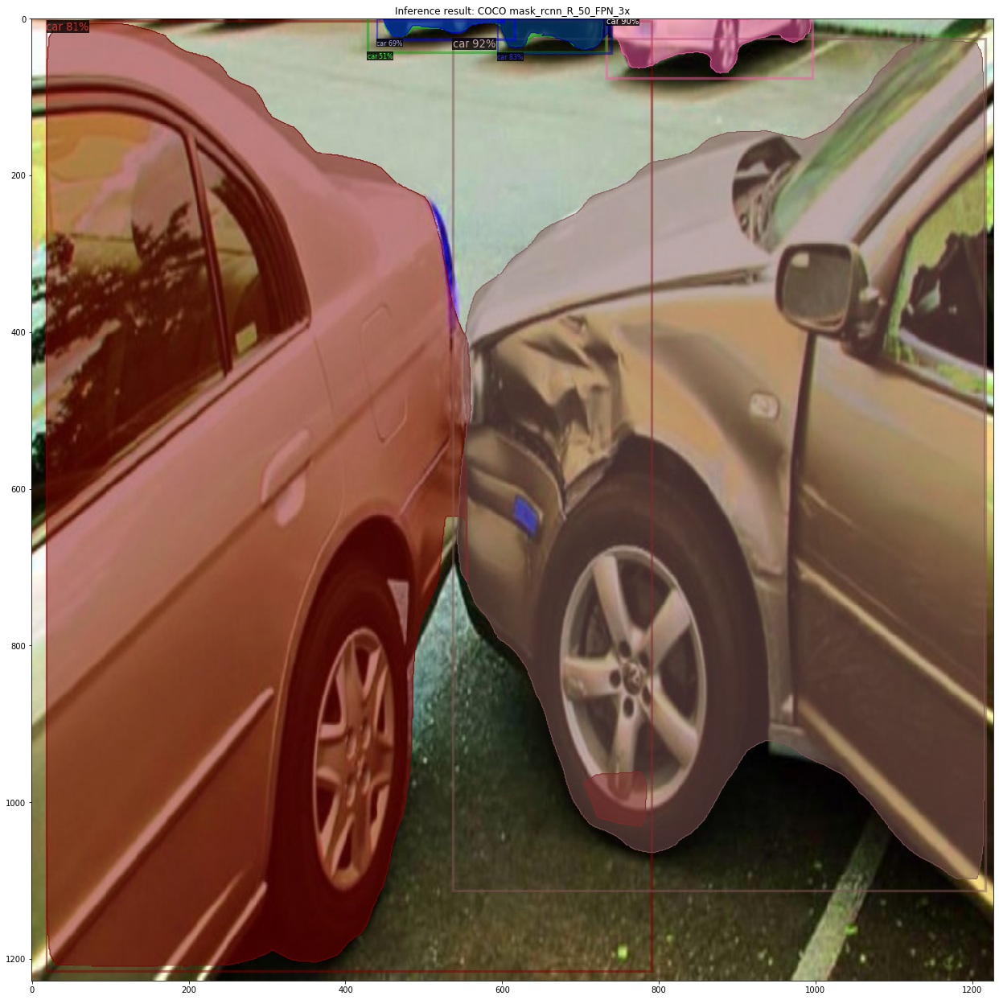

In [78]:
# Create a detectron2 config and DefaultPredictor to run inference on the above image.
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(img)
# Use `Visualizer` to draw the predictions on the image.
v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize=(22,22))
plt.imshow(v.get_image()[:, :, ::-1])
plt.title('Inference result: COCO mask_rcnn_R_50_FPN_3x')
plt.show()

### 3) Mask R-CNN <b>ResNet-101 FPN 3x</b> Backbone (<b>COCO</b> mask_rcnn_R_101_FPN_3x.yaml)

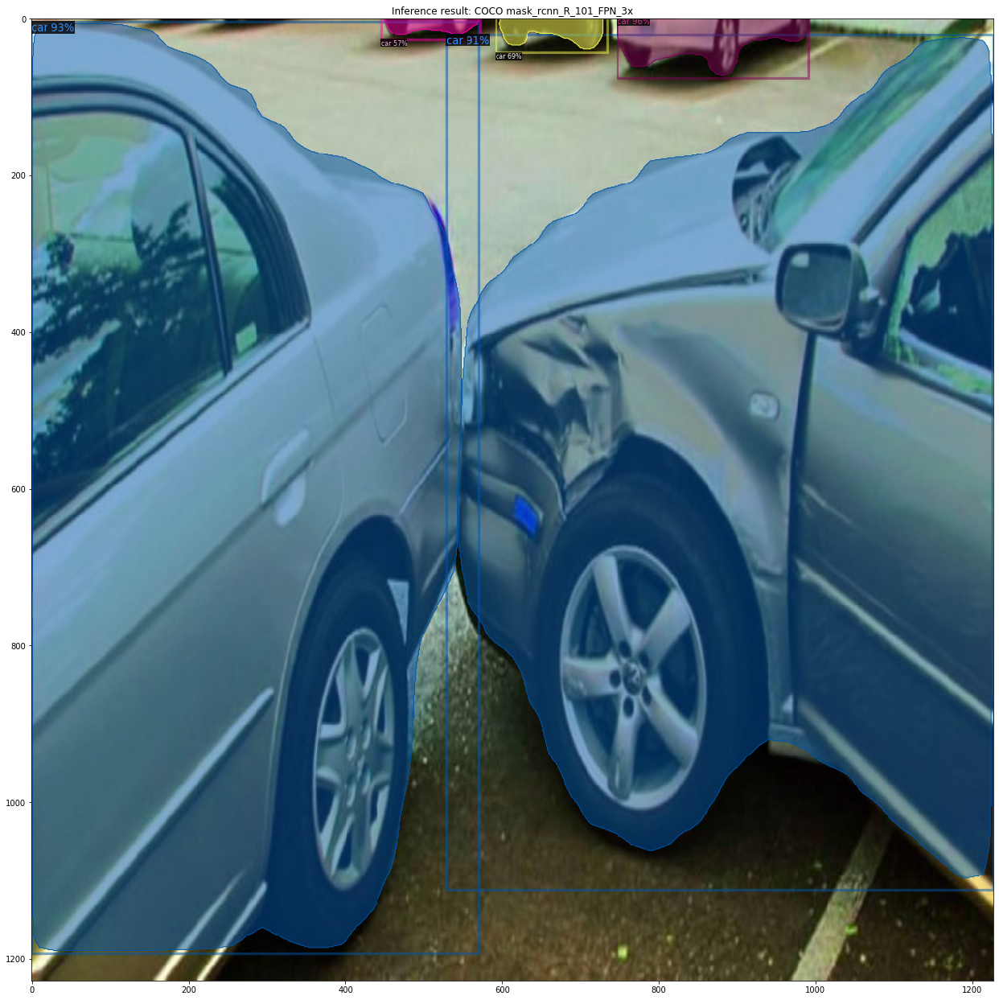

In [79]:
# Create a detectron2 config and DefaultPredictor to run inference on the above image.
# cfg.merge_from_file(model_zoo.get_config_file("LVIS-InstanceSegmentation/mask_rcnn_R_101_FPN_1x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("LVIS-InstanceSegmentation/mask_rcnn_R_101_FPN_1x.yaml")
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(img)
# Use `Visualizer` to draw the predictions on the image.
v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize=(22,22))
plt.imshow(v.get_image()[:, :, ::-1])
plt.title('Inference result: COCO mask_rcnn_R_101_FPN_3x')
plt.show()

### 4) Mask R-CNN <b>ResNet-50 FPN 1x</b> Backbone (<b>LVIS</b> mask_rcnn_R_50_FPN_1x.yaml)

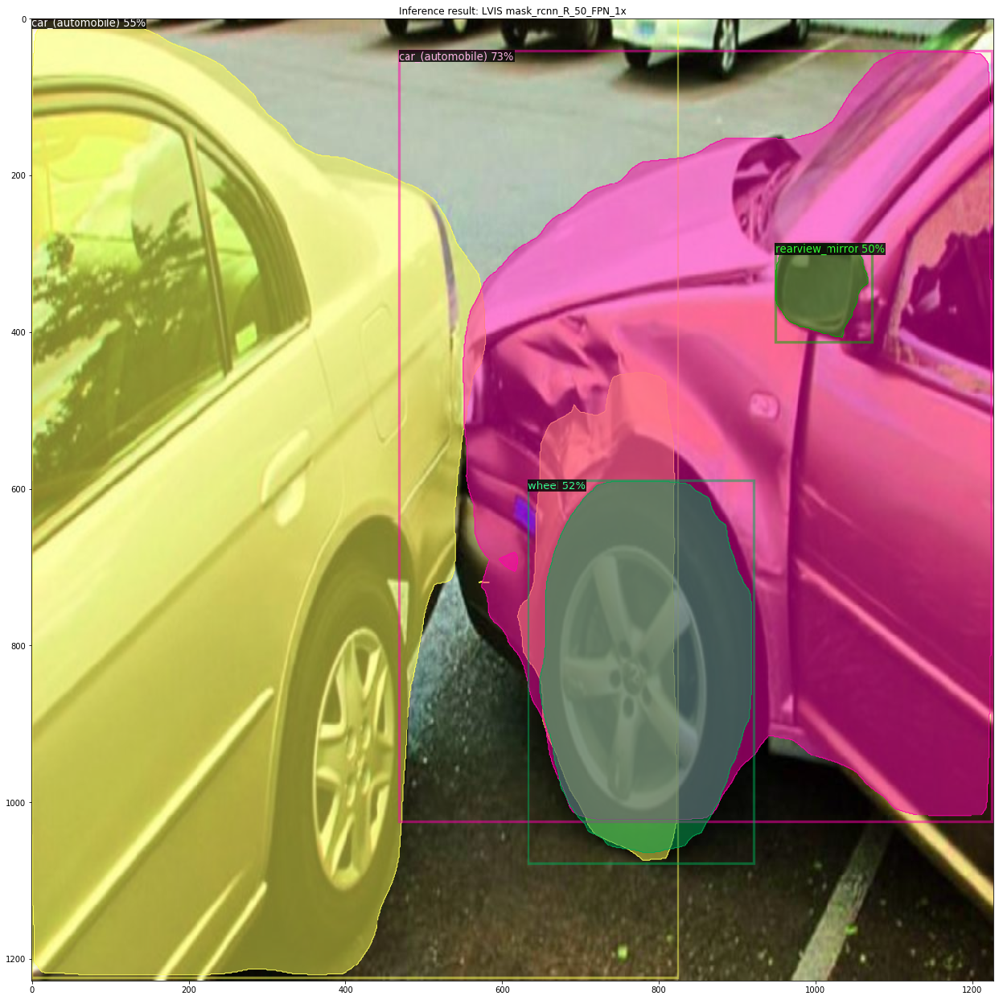

In [80]:
# Create a detectron2 config and DefaultPredictor to run inference on the above image.
# LVIS: A DATASET FOR LARGE VOCABULARY INSTANCE SEGMENTATION
# 1200+ Categories, 164k images
cfg.merge_from_file(model_zoo.get_config_file("LVIS-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("LVIS-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(img)
# Use `Visualizer` to draw the predictions on the image.
v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize=(22,22))
plt.imshow(v.get_image()[:, :, ::-1])
plt.title('Inference result: LVIS mask_rcnn_R_50_FPN_1x')
plt.show()

### 5) Mask R-CNN <b>ResNet-101 FPN 1x</b> Backbone (<b>LVIS</b> mask_rcnn_R_101_FPN_1x.yaml)

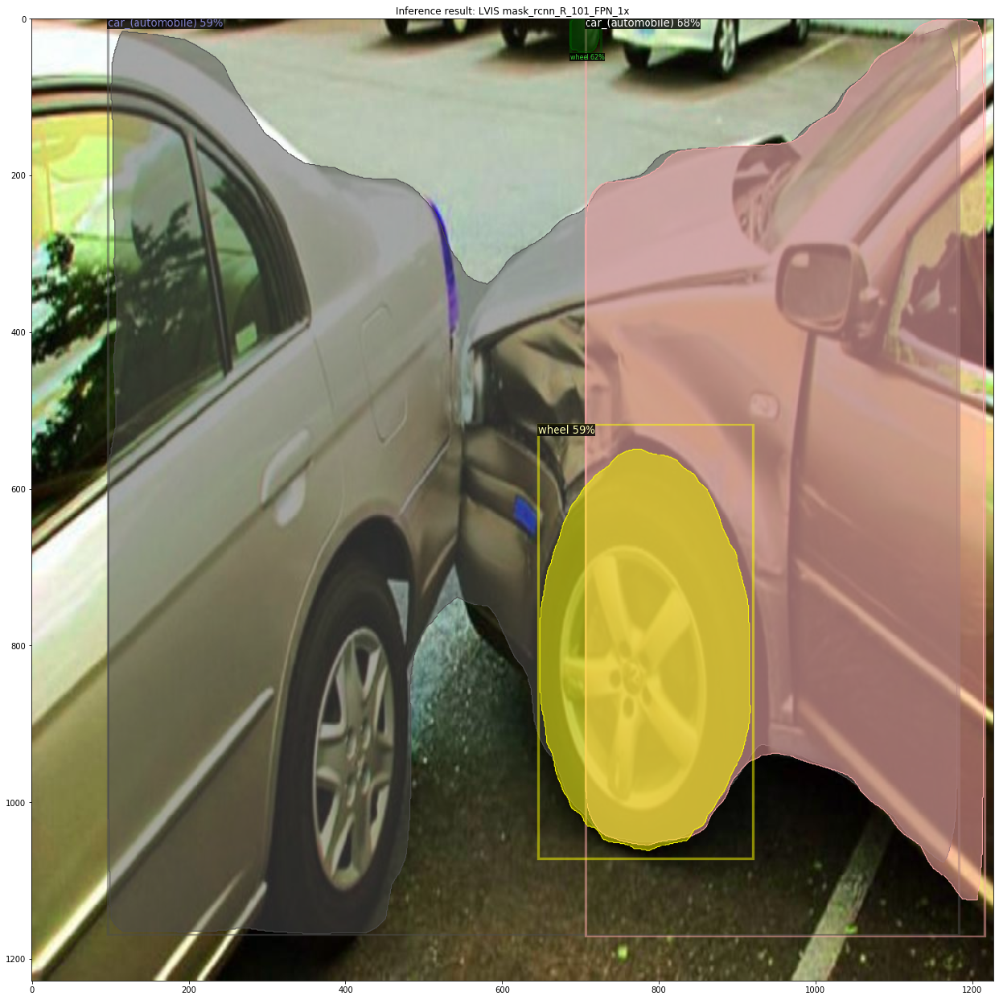

In [81]:
# Create a detectron2 config and DefaultPredictor to run inference on the above image.
cfg.merge_from_file(model_zoo.get_config_file("LVIS-InstanceSegmentation/mask_rcnn_R_101_FPN_1x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("LVIS-InstanceSegmentation/mask_rcnn_R_101_FPN_1x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(img)
# Use `Visualizer` to draw the predictions on the image.
v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize=(22,22))
plt.imshow(v.get_image()[:, :, ::-1])
plt.title('Inference result: LVIS mask_rcnn_R_101_FPN_1x')
plt.show()

### 6) Mask R-CNN <b>ResNet-101</b> FPN 1x Backbone (<b>Cityscapes</b> mask_rcnn_R_50_FPN.yaml)

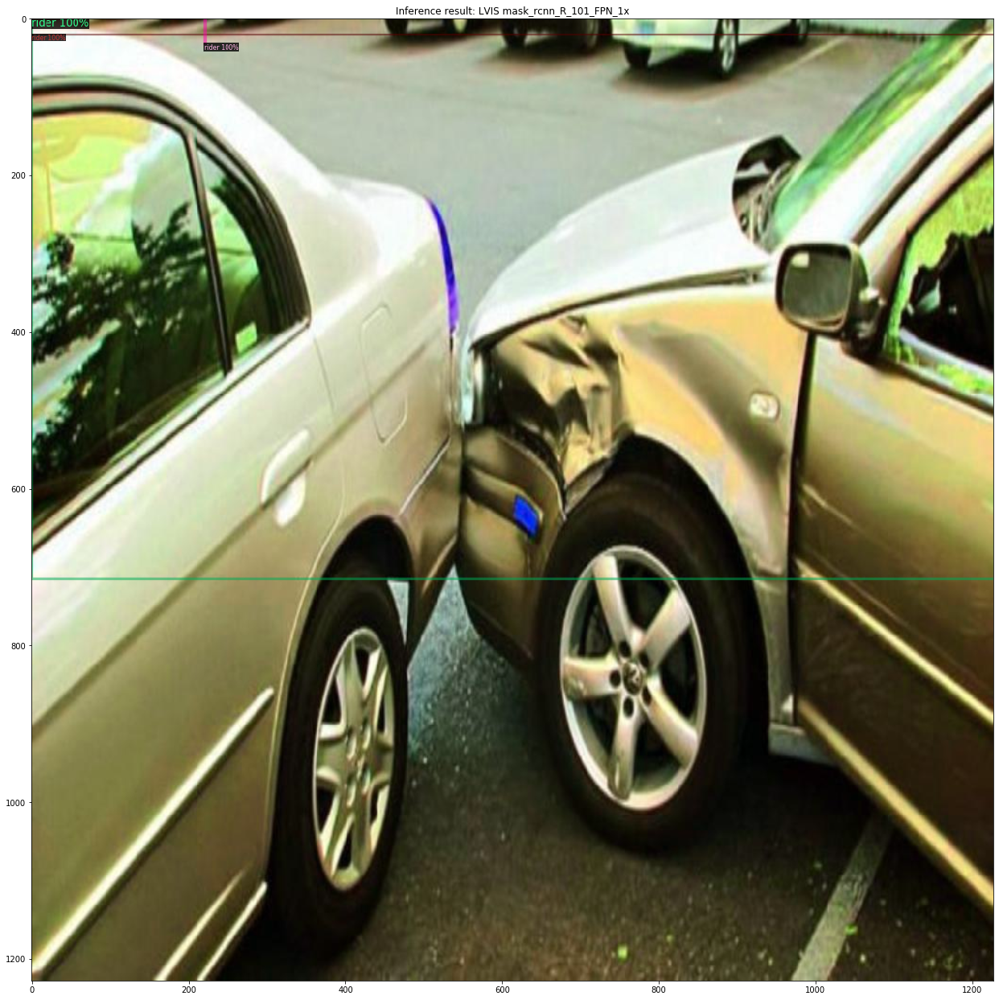

In [82]:
# Create a detectron2 config and DefaultPredictor to run inference on the above image.
cfg.merge_from_file(model_zoo.get_config_file("Cityscapes/mask_rcnn_R_50_FPN.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("Cityscapes/mask_rcnn_R_50_FPN.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(img)
# Use `Visualizer` to draw the predictions on the image.
v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize=(22,22))
plt.imshow(v.get_image()[:, :, ::-1])
plt.title('Inference result: LVIS mask_rcnn_R_101_FPN_1x')
plt.show()

## <br><b>References

Detectron2 contributors Revision, (2020). Detectron2 Beginner's Tutorial [online]. Google Colab.<br> [Viewed 15 March 2020]. Available from: https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5<br>

Mitchell, L., Sri.Yogesh, K. and Subramanian, V., (2019). Deep Learning with PyTorch 1.x, Packt Publishing, Birmingham<br>

Sourish, N., (2019). Car damage detection using CNN [online]. GitHub.<br> [Viewed 12 March 2020]. Available from: https://github.com/nitsourish/car-damage-detection-using-CNN/tree/master